# EEUS2018 - NexGenMap Session

This material is part of NexGenMap breakout session of [2018 Google Earth Engine User Summit](https://sites.google.com/earthoutreach.org/eeus2018/home).

The NexGenMap is a project that aims establish the next generation of land use and land cover mapping and monitoring tools, using high-res images (i.e. Planet data), cloud-computing platforms (i.e. Google Earth Engine and Google Cloud Computing) and machine learning and deep-learning techniques (e.g. Random Forest, U-Net and LSTM).

## Earth Engine Hands-on

In the NexGenMap we are using, mainly, [Random Forest](https://link.springer.com/article/10.1023/A:1010933404324) algorithm and a known classification approach that have been used by our project team in the [MapBiomas](http://mapbiomas.org/). This classification approach was applied over the NexGenMap mosaics, that was produced using 4-band PlanetScope scenes. In the context of the project, the Planet and Google team are maintain a Earth Engine asset, with Planet raw images, updated.

Project Google Earth Engine scripts:
* [4-band PlanetScope Exploration](https://code.earthengine.google.com/1cb3eacd64c61fd786b6cf9b3c1bd99b)
* [NexGenMap Mosaic Exploration](https://code.earthengine.google.com/44b485d07ee807c9cd3f651ab64301c7)
* [Land-Cover and Land-Use Random Forest Classification](https://code.earthengine.google.com/ed882d16d10cb6e16d5072f2d94961ab)

## Tensorflow Hands-on

In the NexGenMap we are using, mainly, two deep-learning approaches: [U-net](https://arxiv.org/abs/1505.04597) and [LSTM](http://www.bioinf.jku.at/publications/older/2604.pdf). The U-net is a fully convolutional network, proposed specifically for [semantic segmentation](http://blog.qure.ai/notes/semantic-segmentation-deep-learning-review) (i.e. when each pixel of the image is assign to a object class), consequently its output has the same size of input image. The LSTM is a traditional recurrent neural network, that consider a temporal dependency between pixel observations (i.e. if the input data is shuffled, in the temporal dimension, the output will be different), consequently it's appropriate for per-pixel time-series classification. This session will present a application of forest detection and deforestation monitor, considering a semantic segmentation approach and monthly Planet mosaics of NexGenMap, and it's organized in:
* [Data and Libraries](#Data-and-Libraries)
* [Data Exploration](#Data-Exploration)
* [Standardizing](#Standardizing)
* [Semantic Segmentation](#Semantic-Segmentation)

Our deep-learning workflow is:
<img src="figs/00-dl_workflow.png">

## Data and Libraries

You will work with 4 monthly mosaic, stored in the [nexdata directory](nexdata), covering a small region, with ~75 km2 of area, located in the middle of the Cerrado biome.

<img src="figs/01-study_area.png">

All methods that will be used are in the module [nexutil](nexutil.py) and in this session you need install follow python libraries:
* [Numpy](http://www.numpy.org/): image computing;
* [Tensorflow](https://www.tensorflow.org/): deep-learning implementation;
* [Scikit-learn](http://scikit-learn.org): machine-learning support;
* [Scikit-image](http://scikit-image.org/): image histogram equalization;
* [Matplotlib](https://matplotlib.org/): image and chart visualization;
* [Seaborn](https://seaborn.pydata.org/): confusion matrix visualization;

First step is import the nexutil module:

In [1]:
import nexutil
from models import unet_v1 as md

Let's visualize all monthly mosaic:

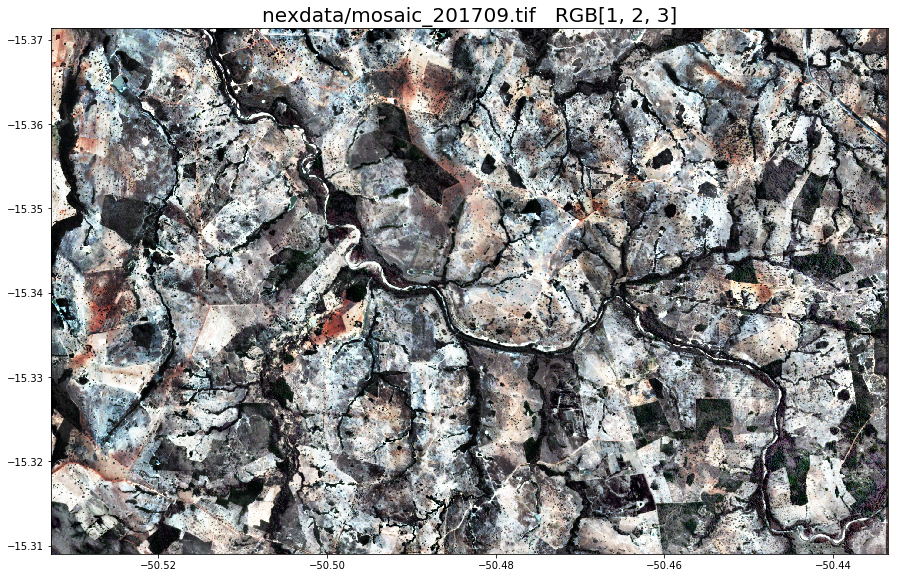

In [2]:
nexutil.vis_image('nexdata/mosaic_201709.tif')

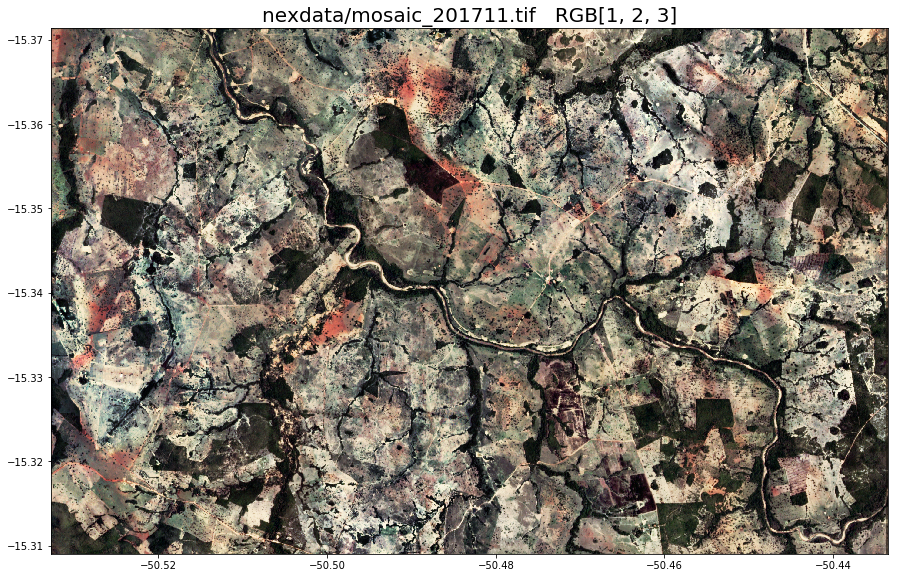

In [3]:
nexutil.vis_image('nexdata/mosaic_201711.tif')

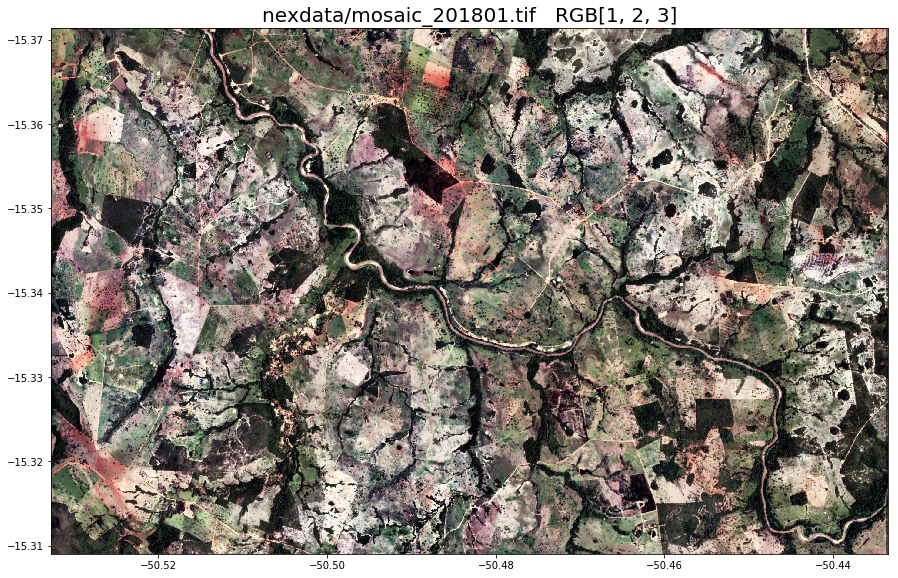

In [37]:
nexutil.vis_image('nexdata/mosaic_201801.tif')

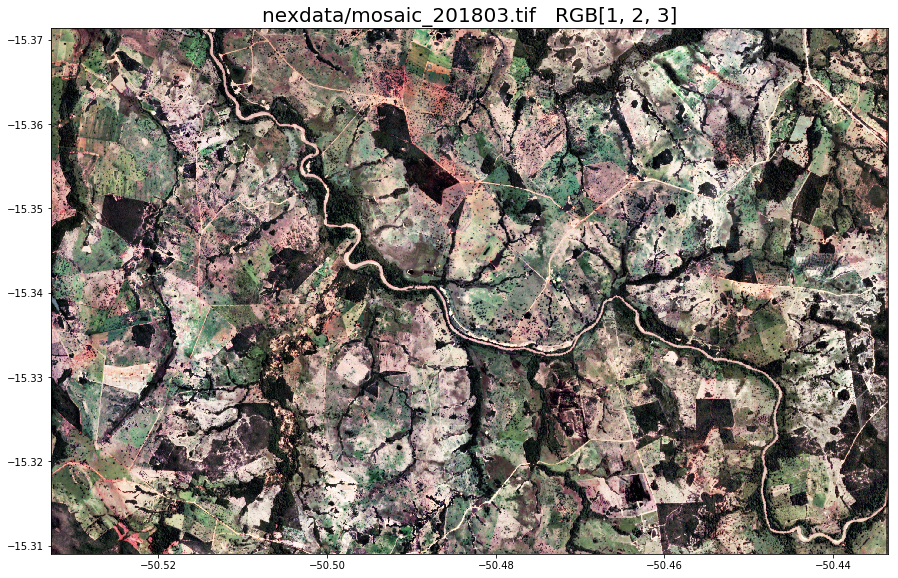

In [5]:
nexutil.vis_image('nexdata/mosaic_201803.tif')

It's possible change the visualization bands:

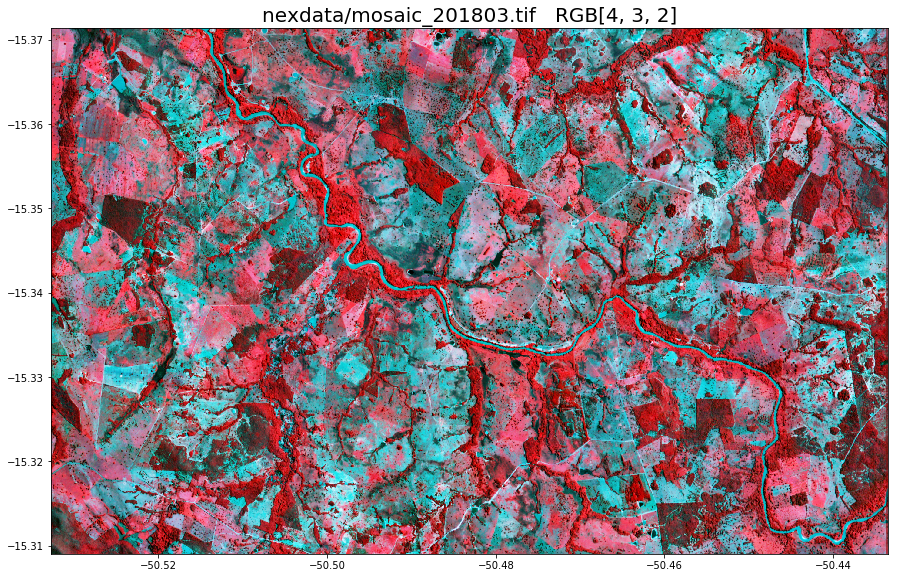

In [6]:
nexutil.vis_image('nexdata/mosaic_201803.tif', bands=[4,3,2])

## Data Exploration

Before start the classification approach, you need understand the characteristics of your data. This step is very important and will be crucial for you achieve good classification results.

Let's read all monthly mosaic:

In [7]:
neximages = [
    'nexdata/mosaic_201709.tif',
    'nexdata/mosaic_201711.tif',
    'nexdata/mosaic_201801.tif',
    'nexdata/mosaic_201803.tif'
]
data_struct = nexutil.read_image_data(neximages)

Reading nexdata/mosaic_201709.tif (4, 1736, 2762) [int32]
Reading nexdata/mosaic_201711.tif (4, 1736, 2762) [int32]
Reading nexdata/mosaic_201801.tif (4, 1736, 2762) [int32]
Reading nexdata/mosaic_201803.tif (4, 1736, 2762) [int32]
Creating Data Struct nfiles=4 nbands=4 xsize=1736 ysize=2762


The result is a data_struct, composed by:
* *filenames*: property with filename that was readed (e.g.: mosaic_201709.tif)
* *bandnames*: property with band names (e.g.: B01)
* *nfiles*: number of files
* *nbands*: number of bands
* *xsize*: number of rows
* *ysize*: number of columns
* *data*: a 4-d numpy array

Check those properties:

In [8]:
print('filenames: ' + str(data_struct['filenames']))
print('bandnames: ' + str(data_struct['bandnames']))
print('nfiles: ' + str(data_struct['nfiles']))
print('nbands: ' + str(data_struct['nbands']))
print('xsize: ' + str(data_struct['xsize']))
print('ysize: ' + str(data_struct['ysize']))
print('data shape: ' + str(data_struct['data'].shape))

filenames: ['mosaic_201709.tif', 'mosaic_201711.tif', 'mosaic_201801.tif', 'mosaic_201803.tif']
bandnames: ['B01', 'B02', 'B03', 'B04']
nfiles: 4
nbands: 4
xsize: 1736
ysize: 2762
data shape: (4, 4, 1736, 2762)


Let's calculate the basic statistics:

In [9]:
nexutil.stats(data_struct)


mosaic_201709.tif:
  B01 min=3600.00 max=12459.00 mean=6255.70 median=6133.00 stdDev=1551.05 variance=2405752.95
  B02 min=5006.00 max=14205.00 mean=7138.75 median=6997.00 stdDev=1290.02 variance=1664144.66
  B03 min=5544.00 max=14807.00 mean=7557.71 median=7415.00 stdDev=1261.99 variance=1592622.88
  B04 min=4502.00 max=12305.00 mean=8257.49 median=8293.00 stdDev=1122.22 variance=1259381.83

mosaic_201711.tif:
  B01 min=3605.00 max=12036.00 mean=6171.75 median=6130.00 stdDev=1315.52 variance=1730603.96
  B02 min=5033.00 max=12774.00 mean=7011.26 median=6976.00 stdDev=965.40 variance=931998.21
  B03 min=5555.00 max=14807.00 mean=7417.18 median=7402.00 stdDev=899.15 variance=808473.56
  B04 min=4502.00 max=12277.00 mean=8121.50 median=8049.00 stdDev=909.96 variance=828030.36

mosaic_201801.tif:
  B01 min=3600.00 max=12036.00 mean=6135.14 median=5927.00 stdDev=1547.11 variance=2393549.31
  B02 min=5006.00 max=13377.00 mean=7020.49 median=6892.00 stdDev=1183.99 variance=1401830.29
  B03 

...and visualize the data histograms (B01-Red, B02-Green, B03-Blue and B04-Purple):

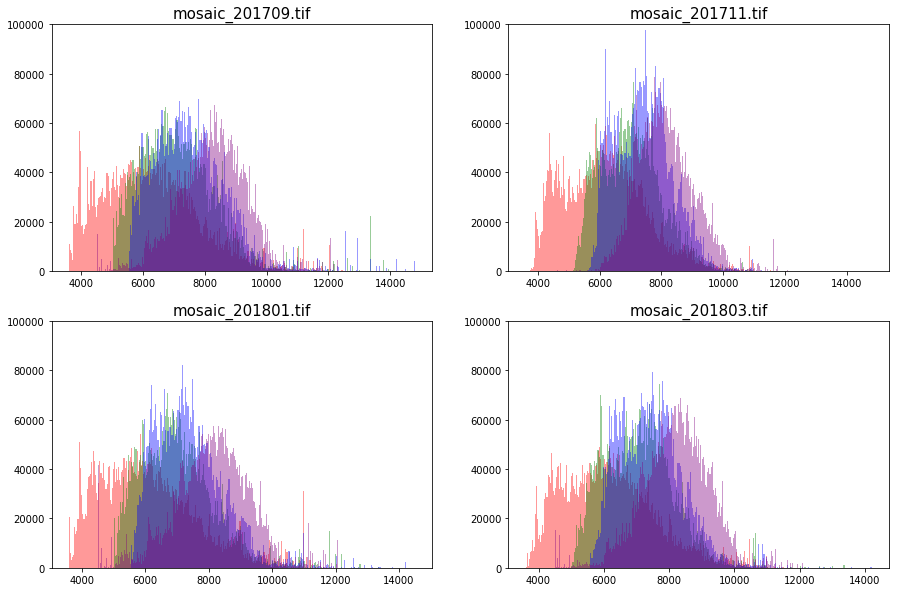

In [10]:
nexutil.vis_histograms(data_struct)

## Standardizing

Here you will standardize the input data, subtracting each values by the median and dividing by the standard deviation. It's a common step of deep-learning classifications that, in general, promotes a faster training, reduces the chances of getting stuck in local optima and removes the scale dependence of the NN initial weights. For more information read this [Dr. Sarle explanation](http://www.faqs.org/faqs/ai-faq/neural-nets/part2/section-16.html).

Let's run the standardize method [(pixel_value - median) / stdDev]:

In [11]:
data_norm_struct = nexutil.standardize(data_struct)

Standardizing data (4, 4, 1736, 2762)


How the statistics looks like now ?

In [12]:
nexutil.stats(data_norm_struct)


mosaic_201709.tif:
  B01 min=-1.69 max=4.39 mean=0.13 median=0.04 stdDev=1.06 variance=1.13
  B02 min=-1.73 max=6.37 mean=0.15 median=0.02 stdDev=1.14 variance=1.29
  B03 min=-1.70 max=6.96 mean=0.18 median=0.05 stdDev=1.18 variance=1.39
  B04 min=-3.43 max=3.85 mean=0.07 median=0.11 stdDev=1.05 variance=1.09

mosaic_201711.tif:
  B01 min=-1.69 max=4.09 mean=0.07 median=0.04 stdDev=0.90 variance=0.81
  B02 min=-1.71 max=5.11 mean=0.03 median=0.00 stdDev=0.85 variance=0.72
  B03 min=-1.69 max=6.96 mean=0.05 median=0.04 stdDev=0.84 variance=0.71
  B04 min=-3.43 max=3.82 mean=-0.05 median=-0.12 stdDev=0.85 variance=0.72

mosaic_201801.tif:
  B01 min=-1.69 max=4.09 mean=0.05 median=-0.10 stdDev=1.06 variance=1.13
  B02 min=-1.73 max=5.64 mean=0.04 median=-0.07 stdDev=1.04 variance=1.09
  B03 min=-1.70 max=6.68 mean=0.02 median=-0.11 stdDev=1.03 variance=1.07
  B04 min=-3.43 max=3.64 mean=-0.07 median=-0.02 stdDev=1.12 variance=1.24

mosaic_201803.tif:
  B01 min=-1.69 max=3.73 mean=0.06 me

...and the histograms ?

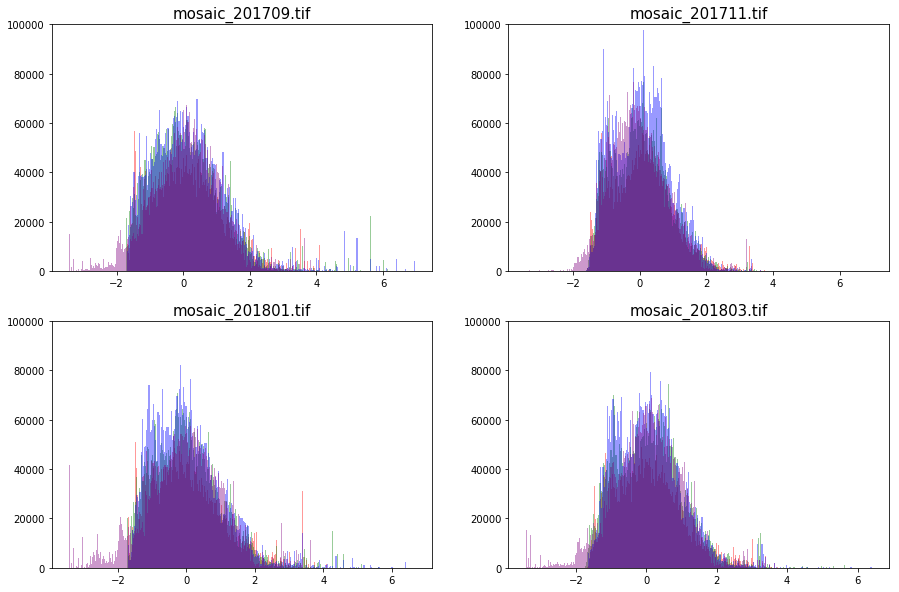

In [13]:
nexutil.vis_histograms(data_norm_struct)

This approach standardized each spectral band individually, considering simultaneously temporal (i.e.the mosaic files) and spatial dimensions. Generally, it improves the generalization of trained model for others monthly mosaics.

## Semantic Segmentation

In the NexGenMap we are using U-NET to classify the Planet monthly mosaics, especially because it captures the spatial context with precise targets location, which is useful for object classification applications in high-resolution images (i.e. 3 meters of spatial resolution). The aspects and concepts of the architecture can be found in the [original paper](https://arxiv.org/pdf/1505.04597.pdf), here we will show how it can be used in remote sensing context.

First U-NET lesson... if you wanna classify objects, you need a training dataset of objects !!!<br><br>
Yes, U-NET is a supervised classification approach, and the most directly way to get a training dataset is through a reference map, preferably produced with GIS segmentation and visually inspection.

Here you have a forest map for the first planet mosaic (mosaic_201709.tif):

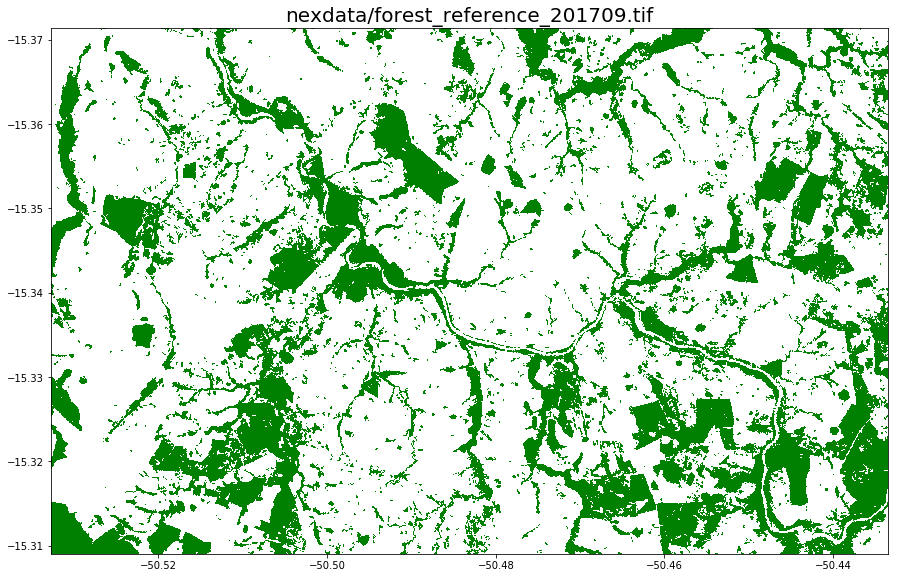

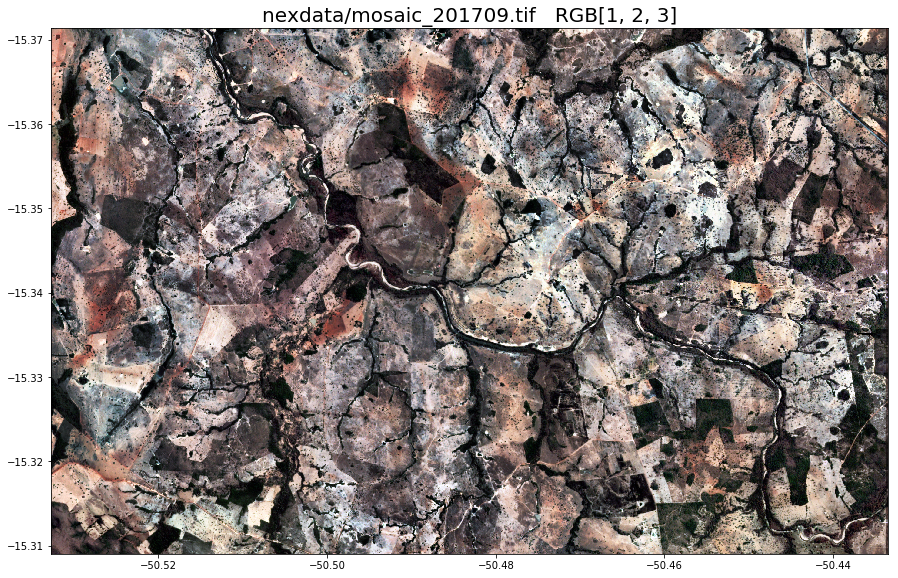

In [14]:
nexutil.vis_refimage('nexdata/forest_reference_201709.tif')
nexutil.vis_image('nexdata/mosaic_201709.tif')

Let's read this forest map:

In [15]:
reference_struct = nexutil.read_image_data(['nexdata/forest_reference_201709.tif'])

Reading nexdata/forest_reference_201709.tif (1, 1736, 2762) [uint8]
Creating Data Struct nfiles=1 nbands=1 xsize=1736 ysize=2762


### Chip Generation

Considering the context of real world applications, which deal with thousands of thousands pixels per image,  a semantic segmentation approach can't classify the whole image at once. So you need divide the input image in many chips (i.e. a small square image), with a fixed size.

Let's transform the August planet mosaic in a lot of 128x128 chips (file_idx indicates the position of file that will be used in the chip generation):

In [16]:
chip_struct_201709 = nexutil.generate_chips(data_norm_struct, file_idx=0, chip_size=128)

The result is a chip_struct_201709, composed by:

* chip_size: the size (same height and width) of chip
* chips_total: number of chips
* indexes: the position (x,y) of chip in original image
* data: a 4-d numpy array

Check those properties.

In [17]:
print('chip_size: ' + str(chip_struct_201709['chip_size']))
print('chips_total: ' + str(chip_struct_201709['chips_total']))
print('First chip index: ' + str(chip_struct_201709['indexes'][0]))
print('Shape of first chip data: ' + str(chip_struct_201709['data'][0].shape))

chip_size: 128
chips_total: 308
First chip index: {'y': 0, 'x': 0}
Shape of first chip data: (4, 128, 128)


You need read it respective reference data (i.e. the forest map):

In [18]:
chip_struct_forest = nexutil.generate_chips(reference_struct, file_idx=0, chip_size=128)

How many chips were generated ?

In [19]:
print('Mosaic_201709: ' + str(chip_struct_201709['chips_total']))
print('Forest_reference: ' + str(chip_struct_forest['chips_total']))

Mosaic_201709: 308
Forest_reference: 308


Let's take a look of them:

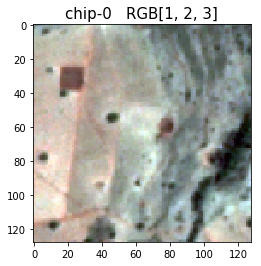

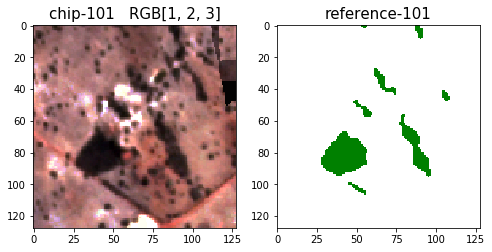

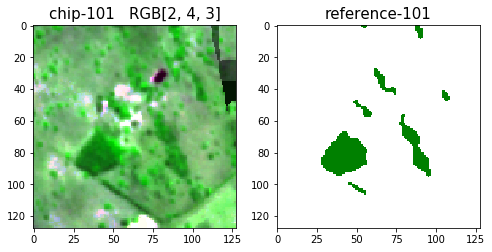

In [20]:
nexutil.vis_chip(chip_struct_201709)
nexutil.vis_chip(chip_struct_201709, chip_struct_forest, idx=101)
nexutil.vis_chip(chip_struct_201709, chip_struct_forest, idx=101, bands=[2,4,3])

### Input Datasets

Following a [well-know machine learning recommendation](https://machinelearningmastery.com/difference-test-validation-datasets/), you need split the chips in train, test and validation datasets

In [21]:
x_train, x_test, x_val, y_train, y_test, y_val = nexutil.split_data(chip_struct_201709, chip_struct_forest)

Splited samples:
 Train (70%): 215
 Test: (15%): 46
 Validation (15%): 47 


### Data Augmentation

The input datasets can be expanded using a data augmentation strategy. Only for train dataset, let's rotate each chip 90°, 180°, 270° and after flip horizontally each rotation:

In [22]:
x_train_aug = nexutil.data_augmentation(x_train)

Input data: (215, 128, 128, 4)
Data augmentation result: (1720, 128, 128, 4)


Don't forget of reference data...

In [23]:
y_train_aug = nexutil.data_augmentation(y_train)

Input data: (215, 128, 128, 1)
Data augmentation result: (1720, 128, 128, 1)


Let's take a look in result:

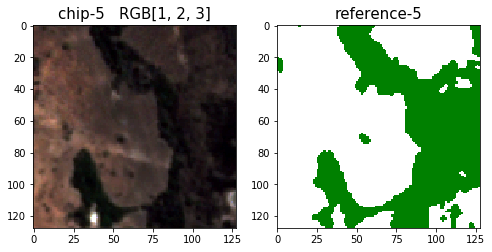

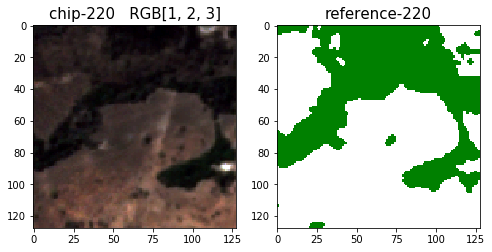

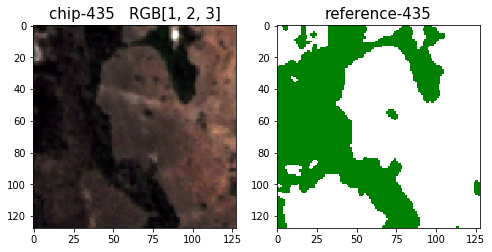

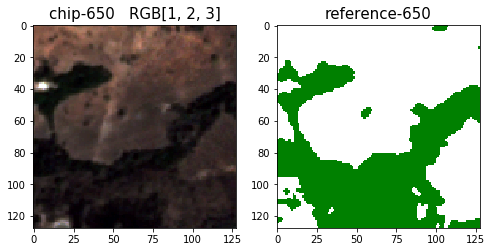

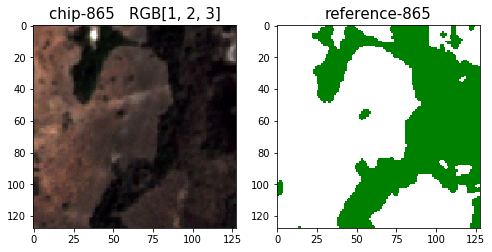

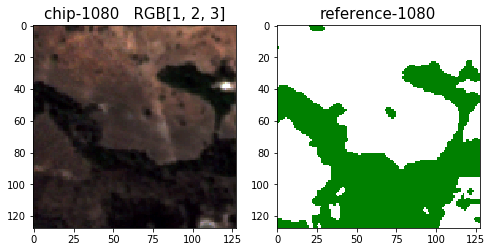

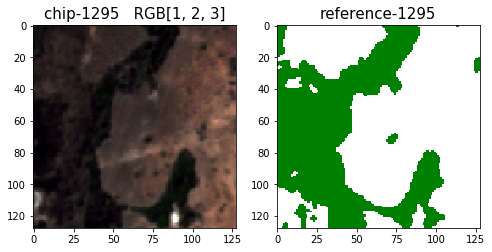

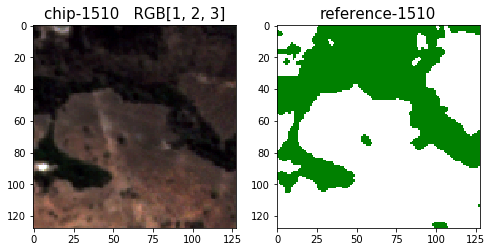

In [24]:
nexutil.vis_augcases(x_train, x_train_aug, y_train_aug, idx=5)

### Training

Our u-net implementation uses [Estimator API of Tensorflow](https://www.tensorflow.org/api_docs/python/tf/estimator/Estimator), with [batch normalization](https://arxiv.org/abs/1502.03167), [IoU loss function](https://link.springer.com/chapter/10.1007/978-3-319-50835-1_22) and [Adam Optimizer](https://arxiv.org/abs/1412.6980) (for more information about [optimization algorithms](http://ruder.io/optimizing-gradient-descent/index.html)). The [Tensorboard](https://www.tensorflow.org/programmers_guide/summaries_and_tensorboard) is used to monitor the training process. 

The model_dir indicates the directory where the training log (i.e. Tensorboard input) and the model parameters will be saved. The hyper_params has the most common hyperparameters of neural networks.

Let's train only 1 epoch (if you don't have GPU, don't use data augmentation result):

In [25]:
model_dir = 'unet_model'
hyper_params = {
    'number_epochs': 1,
    'batch_size': 100,
    'learning_rate': 0.0001
}
nexutil.train(x_train, y_train, x_test, y_test, hyper_params, model_dir)

INFO:tensorflow:Using default config.
INFO:tensorflow:Using config: {'_model_dir': 'unet_model', '_keep_checkpoint_every_n_hours': 10000, '_tf_random_seed': 1, '_is_chief': True, '_session_config': None, '_master': '', '_save_checkpoints_secs': 600, '_task_type': 'worker', '_save_summary_steps': 100, '_num_worker_replicas': 1, '_log_step_count_steps': 100, '_save_checkpoints_steps': None, '_cluster_spec': <tensorflow.python.training.server_lib.ClusterSpec object at 0x7f78d198fc88>, '_service': None, '_task_id': 0, '_num_ps_replicas': 0, '_keep_checkpoint_max': 5}
INFO:tensorflow:Create CheckpointSaverHook.
INFO:tensorflow:Restoring parameters from unet_model/model.ckpt-3
INFO:tensorflow:Saving checkpoints for 4 into unet_model/model.ckpt.
INFO:tensorflow:
INFO:tensorflow:step = 4, loss = 0.97386026
INFO:tensorflow:Saving checkpoints for 6 into unet_model/model.ckpt.
INFO:tensorflow:Loss for final step: 0.9541699.
INFO:tensorflow:Starting evaluation at 2018-06-18-11:28:01
INFO:tensorflo

In general, training a U-NET, or any other neural network, takes time. To avoid this "boring" task you can use a pre-trained model, that was trained with data augmentation result, in a multi-GPU server, for almost 1 hour.

In [26]:
model_dir = 'unet_model_trained'

Train log can be checked in a [Tensorboard instance](http://35.233.175.19:6006):

### Evaluate 

There are a lot of classification metrics, but almost them are derived from the confusion matrix. Here we are using the [precision](http://scikit-learn.org/stable/modules/generated/sklearn.metrics.precision_score.html), [recall](http://scikit-learn.org/stable/modules/generated/sklearn.metrics.recall_score.html) and [f1-score](http://scikit-learn.org/stable/modules/generated/sklearn.metrics.f1_score.html) (for more information about [classification metrics](http://scikit-learn.org/stable/modules/model_evaluation.html)):

<img src="figs/02_classification metrics.png">



In remote sensing area the precision was renamed to Producer's Accuracy (the producer of the classification is interested in how well a specific area on Earth can be mapped) and the recall was renamed to User's Accuracy (the user of classification is interested in how well the map represents what is really on the ground) ([Story, 1986](https://www.asprs.org/wp-content/uploads/pers/1986journal/mar/1986_mar_397-399.pdf)).

Let's evaluate the classification performance in the test dataset:


--------------------------------------------------
------------- CLASSIFICATION METRICS -------------
--------------------------------------------------
             precision    recall  f1-score   support

 Not-forest       0.95      0.99      0.97    543482
     Forest       0.97      0.87      0.92    210182

avg / total       0.96      0.96      0.95    753664



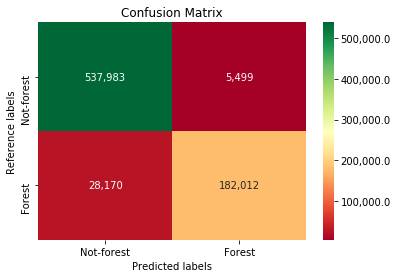

In [27]:
nexutil.evaluate(x_test, y_test, hyper_params, model_dir)

.. and now in the validation dataset:


--------------------------------------------------
------------- CLASSIFICATION METRICS -------------
--------------------------------------------------
             precision    recall  f1-score   support

 Not-forest       0.95      0.99      0.97    570701
     Forest       0.95      0.86      0.90    199347

avg / total       0.95      0.95      0.95    770048



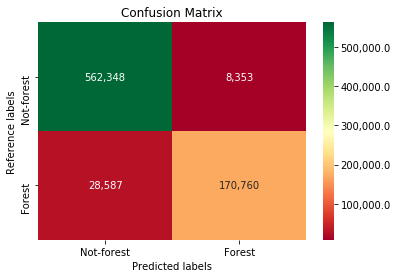

In [28]:
nexutil.evaluate(x_val, y_val, hyper_params, model_dir)

### Predict

After check the classification metrics, and get good results, you will, finally, produce a map. It will permit evaluate the spatial consistency of classification output.

Let's predict the files mosaic_201709.tif

In [29]:
predict_struct_201709 = nexutil.predict(chip_struct_201709, hyper_params, model_dir)

Predicting chips (308, 128, 128, 4)...


...and now it's the time of mosaic_201703.tif, which wasn't used in the training:

In [30]:
chip_struct_201803 = nexutil.generate_chips(data_norm_struct, file_idx=3, chip_size=128)
predict_struct_201803 = nexutil.predict(chip_struct_201803, hyper_params, model_dir)

Predicting chips (308, 128, 128, 4)...


Let's take a look in results, comparing them in the same area (i.e. the same chip):

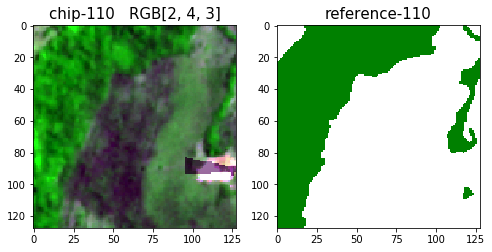

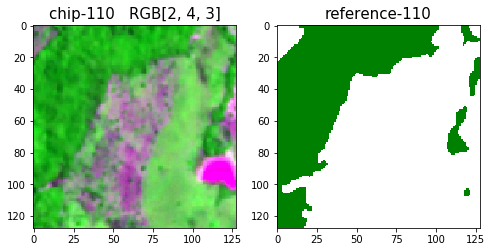

In [31]:
nexutil.vis_chip(chip_struct_201709, predict_struct_201709, idx=110, bands=[2,4,3])
nexutil.vis_chip(chip_struct_201803, predict_struct_201803, idx=110, bands=[2,4,3])

Finally you generate the classification images, with the same structure (e.g. pixel size, projection and total of pixels) of the input images.

In [32]:
nexutil.write_chip('nexdata/mosaic_201709.tif', 'nexdata/mosaic_201709_predict.tif', predict_struct_201709)
nexutil.write_chip('nexdata/mosaic_201803.tif', 'nexdata/mosaic_201803_predict.tif', predict_struct_201803)

Here is the classification result of august/2017 (mosaic_201709.tif):

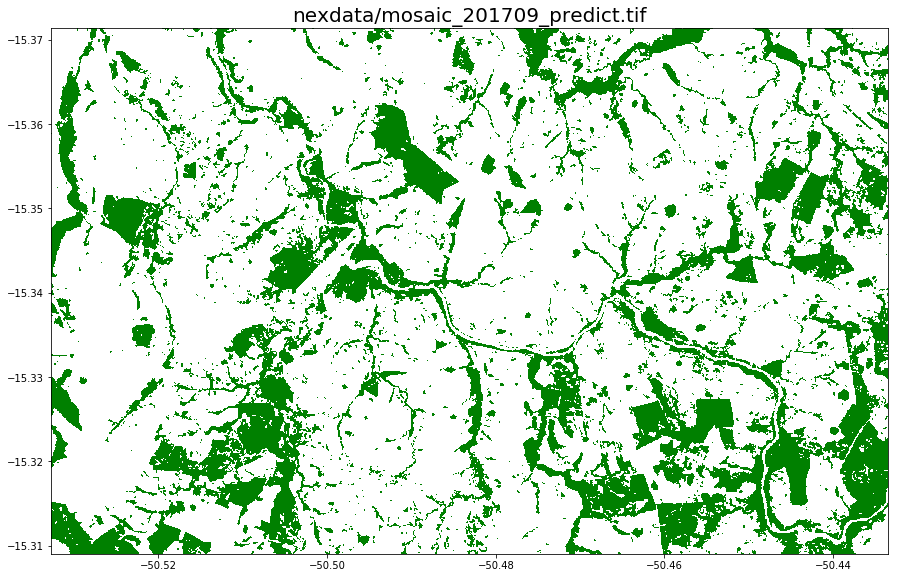

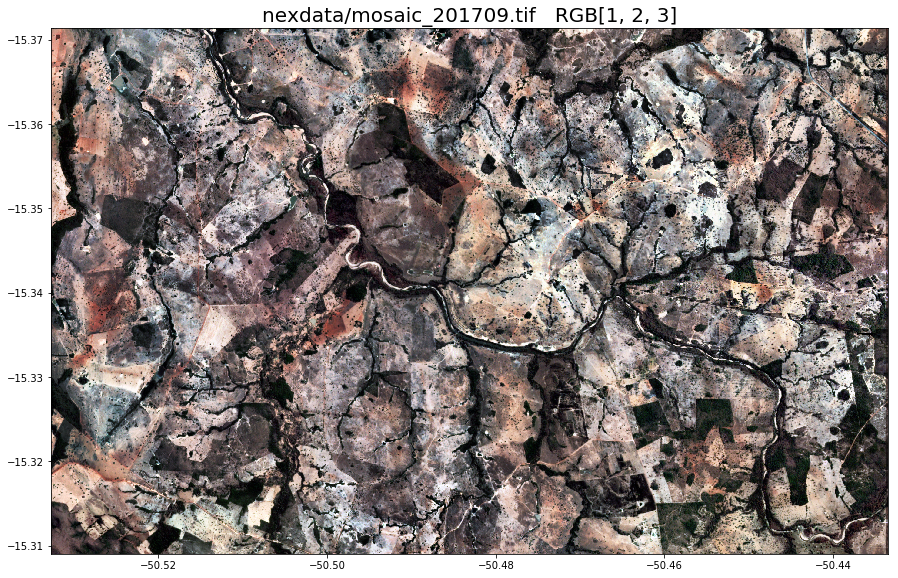

In [33]:
nexutil.vis_refimage('nexdata/mosaic_201709_predict.tif')
nexutil.vis_image('nexdata/mosaic_201709.tif')

... and march/2018 (mosaic_201803.tif):

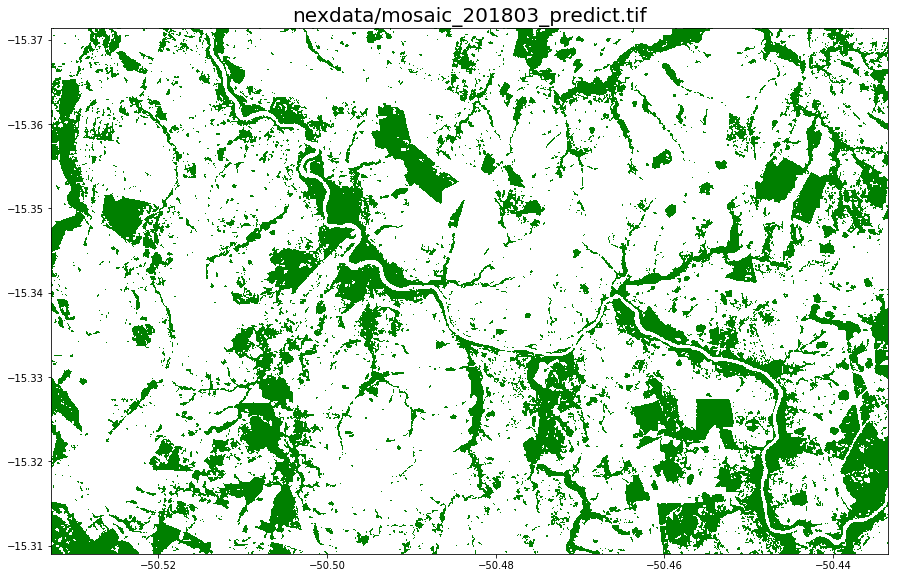

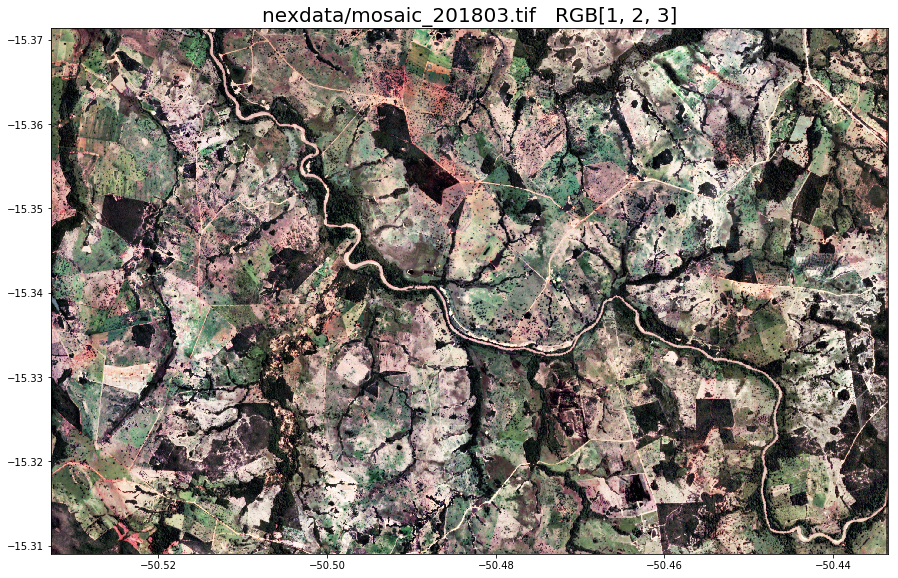

In [34]:
nexutil.vis_refimage('nexdata/mosaic_201803_predict.tif')
nexutil.vis_image('nexdata/mosaic_201803.tif')

Download and import the files as assets in [GEE (Click here to view the results)](https://code.earthengine.google.com/54485312e917f422d29966f5edecd2de):
* [mosaic_201709.tif](nexdata/mosaic_201709.tif?download=1])
* [mosaic_201709_predict.tif](nexdata/mosaic_201709_predict.tif?download=1])
* [mosaic_201803.tif](nexdata/mosaic_201803.tif?download=1])
* [mosaic_201803_predict.tif](nexdata/mosaic_201803_predict.tif?download=1])

### Next Steps
Specifically for deforestation monitor, we will investigate a LSTM based approach and the possibility to use more than one image in the U-Net.

This document and all used files (i.e. code and images) are under [Creative Commons 4.0 License](https://creativecommons.org/licenses/by/4.0/).